# (23) MNIST—Gaus—1

**Motivation**: Fit MNIST, fully conv, Gaussian. Device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'gaussian'

## CONV + FF

In [3]:
kws_vae = dict(
    dataset='MNIST',
    n_latents=10,
    enc_type='conv',
    dec_type='conv',
    enc_bias=True,
    dec_bias=True,
)
kws_tr = dict(
    kl_beta=1.0,
    batch_size=200, epochs=600, lr=1e-3,
    temp_stop=1.0, temp_anneal_portion=0.0,
)

vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**kws_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**kws_tr), device=device)

In [4]:
vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}")

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
| GaussianVAE |  7.3 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  6.1 Mil   |
|    fc_enc   |   10.3 K   |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

gaussian_None_MNIST_z-10_k-32_<conv+b|conv+b>_wn
mc_b200-ep600-lr(0.001)_beta(1:0x0.5)_gr(500)

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([20]))

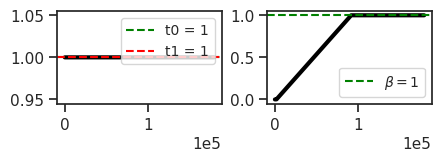

In [6]:
tr.show_schedules()

## Train

In [7]:
# comment = f"..._{tr.cfg.name()}"
comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 600, avg loss: 22.726567: 100%|█████████████████████████| 600/600 [2:21:20<00:00, 14.13s/it]


## Eval

### Loss vld (freeze)

In [15]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 11.147932, 'kl': 13.375367, 'kl_diag': 1.3375367, 'tot': 24.5233}

### Identify dead neurons

In [16]:
dead_thres = 0.0
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [17]:
loss['kl_diag']

array([2.0792687, 0.5200122, 1.5143677, 0.6901829, 1.3611085, 0.904368 ,
       1.6443924, 2.295313 , 1.3487636, 1.0175896], dtype=float32)

### Spike counts

In [18]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.01)
percents

{'0': 38.3,
 '1': 24.5,
 '-1': 24.0,
 '2': 6.1,
 '-2': 5.9,
 '3': 0.6,
 '-3': 0.5,
 '-4': 0.0,
 '-5': 0.0,
 '4+': 0.0}

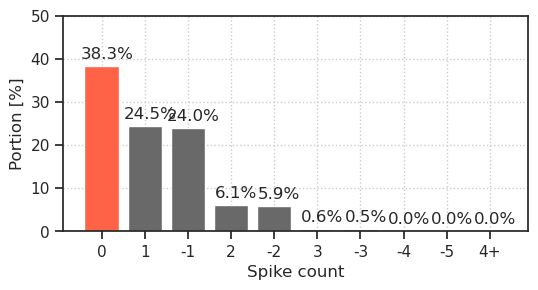

In [19]:
fig, ax = create_figure(1, 1, (6, 2.8))

max_val = float(list(percents.values())[0])
ax.set(
    xlabel='Spike count',
    ylabel='Portion [%]',
    ylim=(0, (np.ceil(max_val / 10) + 1) * 10),
)

colors = ['tomato' if lbl == '0' else 'dimgrey' for lbl in percents]
bars = ax.bar(percents.keys(), percents.values(), color=colors)

for bar in bars:
    y = bar.get_height()
    x = bar.get_x() + 1.3 * bar.get_width() / 2
    plt.text(x, y + 1, f'{y:0.1f}%', ha='center', va='bottom')

ax.locator_params(axis='y', nbins=5)

ax.grid()
plt.show()

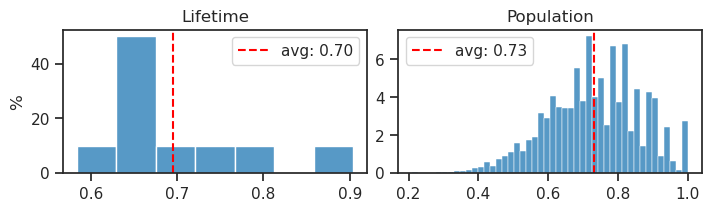

In [13]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [14]:
tot_nspks = data['z'][:, ~dead].sum(1)
tot_firing = (data['z'][:, ~dead] > 0).mean(1)

min(tot_nspks), max(tot_nspks)

(0.0, 40.0)

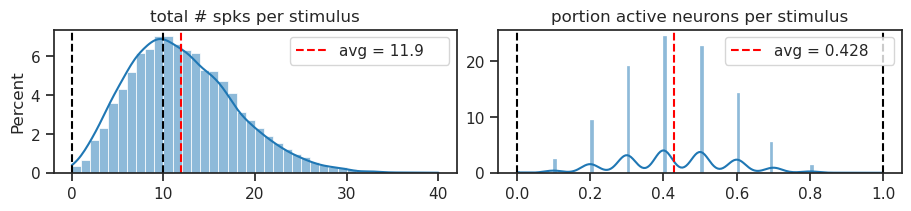

In [15]:
a = np.floor(min(tot_nspks) / 10) * 10
b = np.ceil(max(tot_nspks) / 10) * 10

fig, axes = create_figure(1, 2, (9, 2), layout='constrained')

sns.histplot(tot_nspks, bins=np.linspace(a, b, int(b - a) + 1), kde=True, stat='percent', ax=axes[0])
sns.histplot(tot_firing, bins=np.linspace(0, 1.0, 101), kde=True, stat='percent', ax=axes[1])

_a = tot_nspks.mean()
axes[0].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.1f}    ')
_a = tot_firing.mean()
axes[1].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.3f}    ')

axes[0].axvline(vae.cfg.n_latents, color='k', ls='--')
axes[1].axvline(1.0, color='k', ls='--')

axes[0].set_title('total # spks per stimulus')
axes[1].set(title='portion active neurons per stimulus', ylabel='')

for ax in axes.flat:
    ax.axvline(0, color='k', ls='--')
    ax.legend()
plt.show()

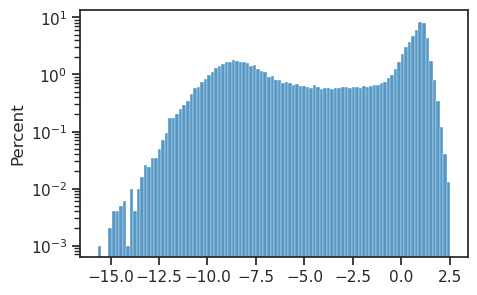

In [17]:
ax = sns.histplot(np.log(etc['r*dr'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

In [18]:
prior_rates = to_np(vae.log_rates)[:, ~dead].ravel()

mu = prior_rates.mean()
sd = prior_rates.std()

rv = sp_stats.norm(loc=mu, scale=sd)
xs = np.linspace(-6.0, 2.0, 100)
pdf = rv.pdf(xs)

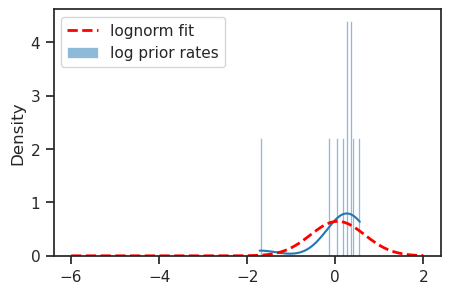

In [19]:
fig, ax = create_figure()

sns.histplot(prior_rates, stat='density', bins=50, kde=True, label='log prior rates', ax=ax)
ax.plot(xs, pdf, color='r', lw=2, ls='--', label='lognorm fit')
add_legend(ax)
plt.show()

<Axes: ylabel='Count'>

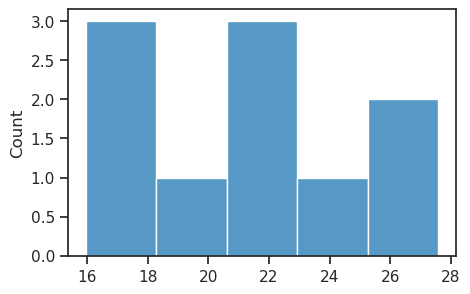

In [20]:
sns.histplot(to_np(torch.norm(vae.fc_dec.weight, dim=0)))

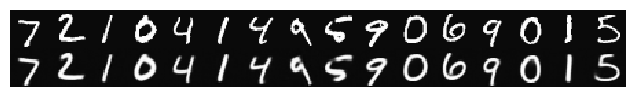

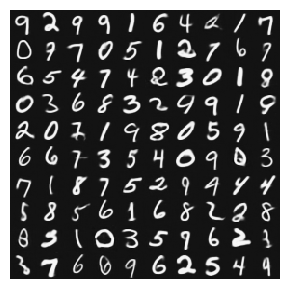

In [20]:
tr.show_recon(1.0), tr.show_samples(1.0);

In [21]:
def _show_pairwise(i, j, key='r*dr'):
    df = pd.DataFrame({
        f'z-{i}': etc[key][:, i],
        f'z-{j}': etc[key][:, j],
        f'z-{i}_log': np.log(np.abs(etc[key][:, i])),
        f'z-{j}_log': np.log(np.abs(etc[key][:, j])),
        'lbl': tr.dl_vld.dataset.test_labels,
    })
    fig, axes = create_figure(1, 2, (10, 5.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

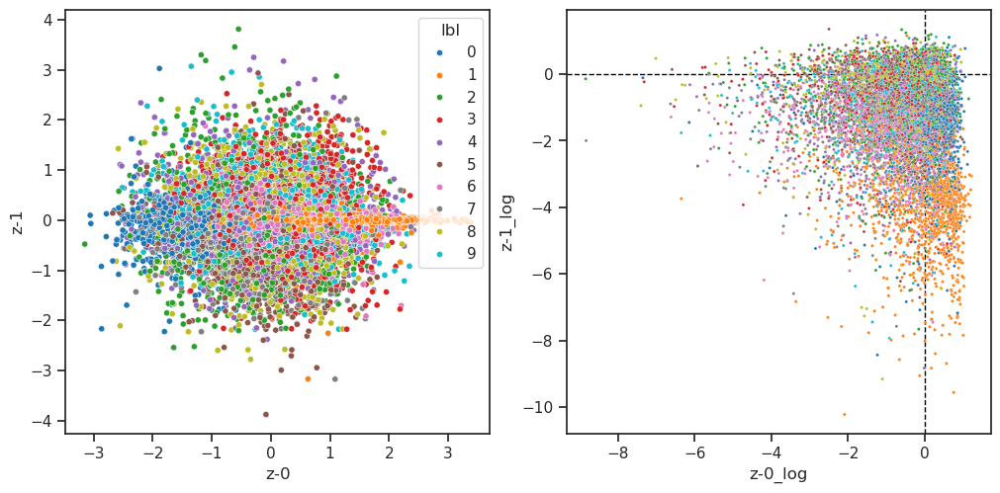

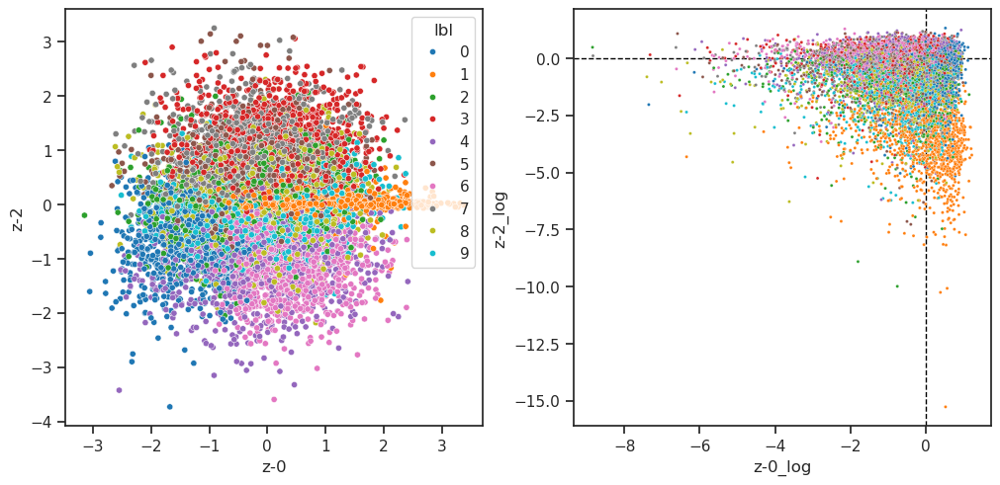

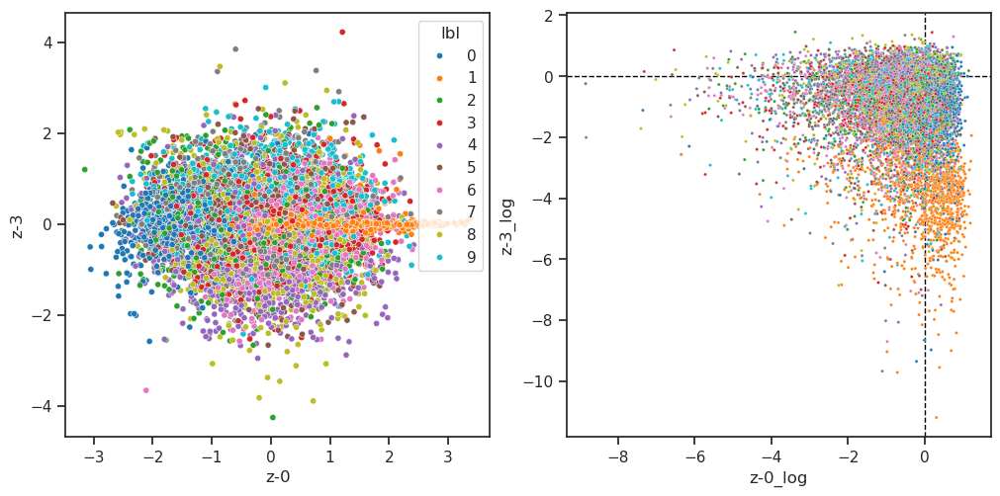

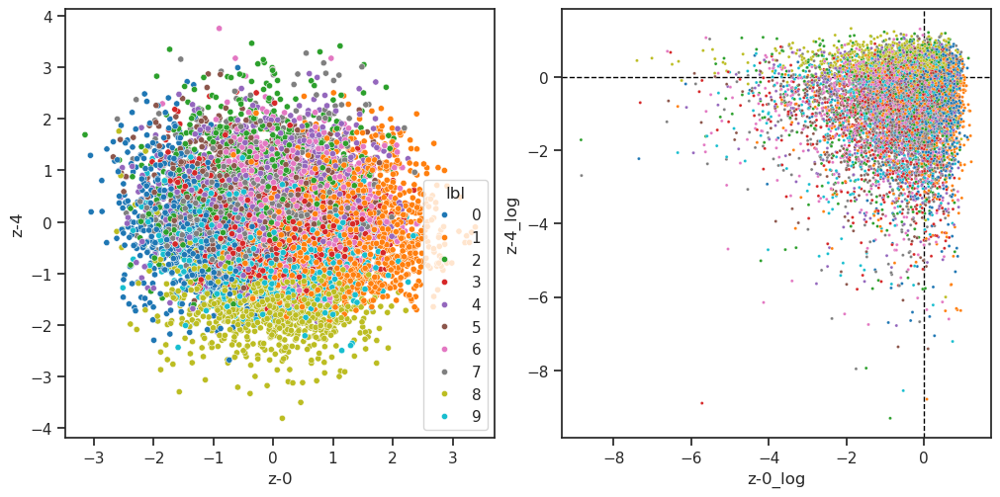

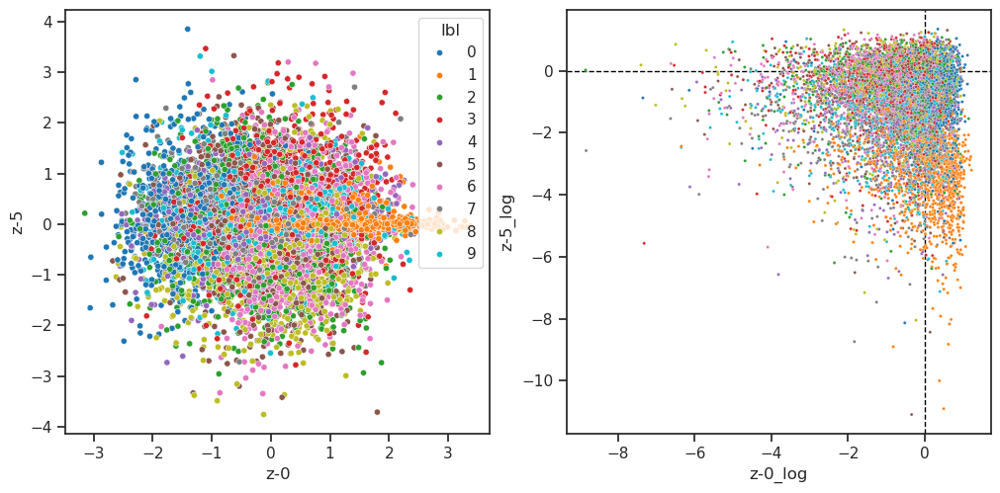

...

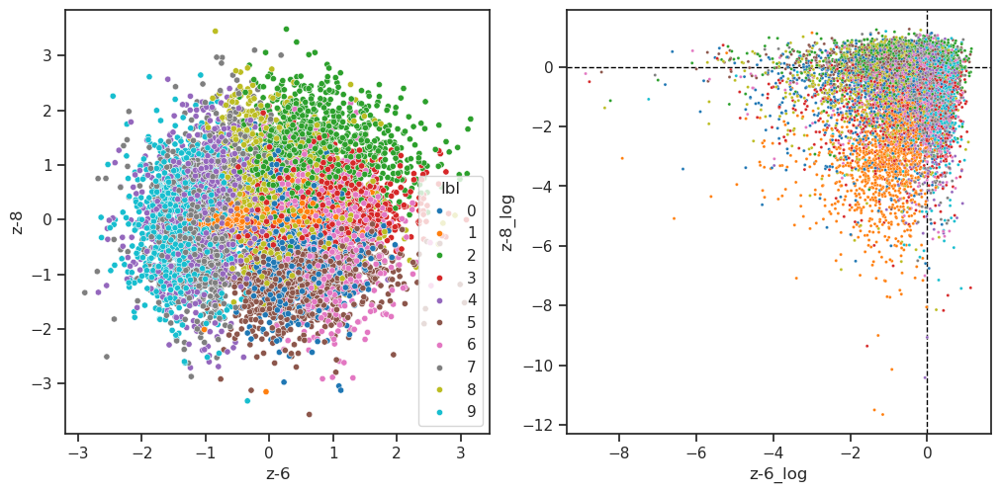

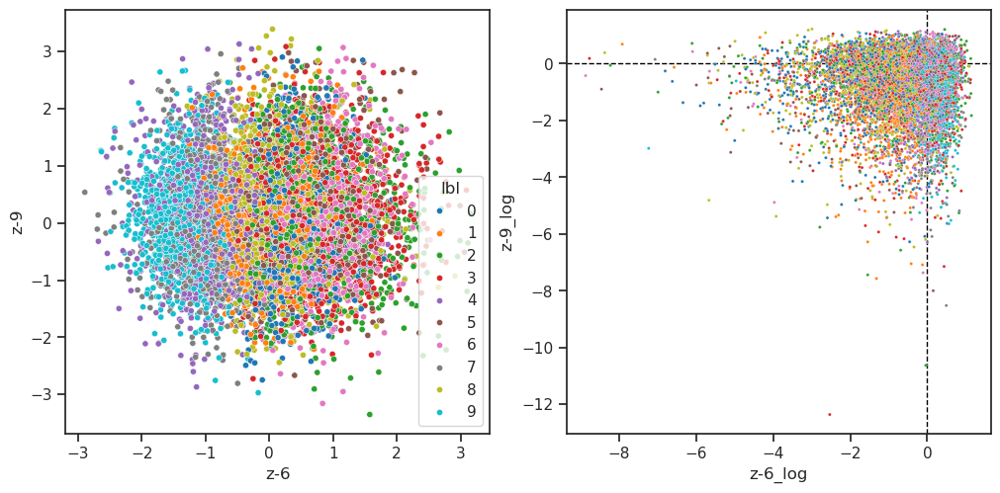

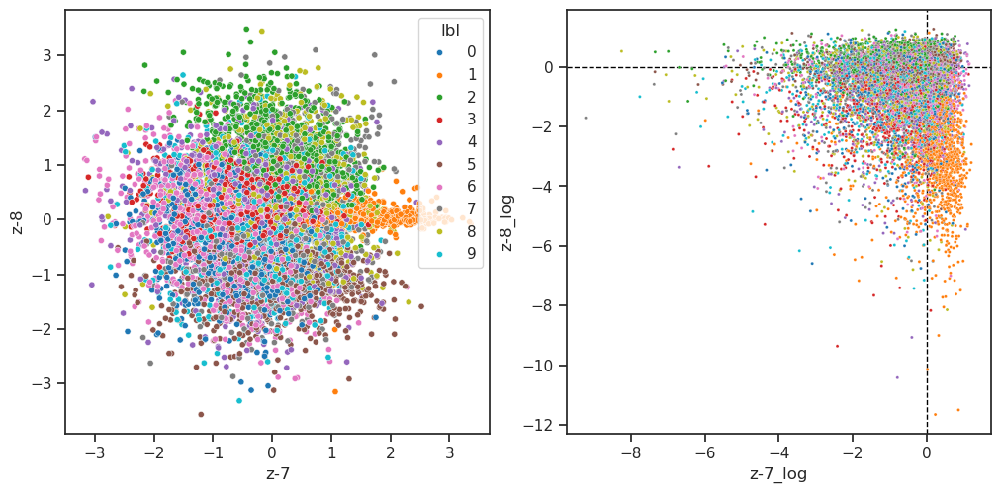

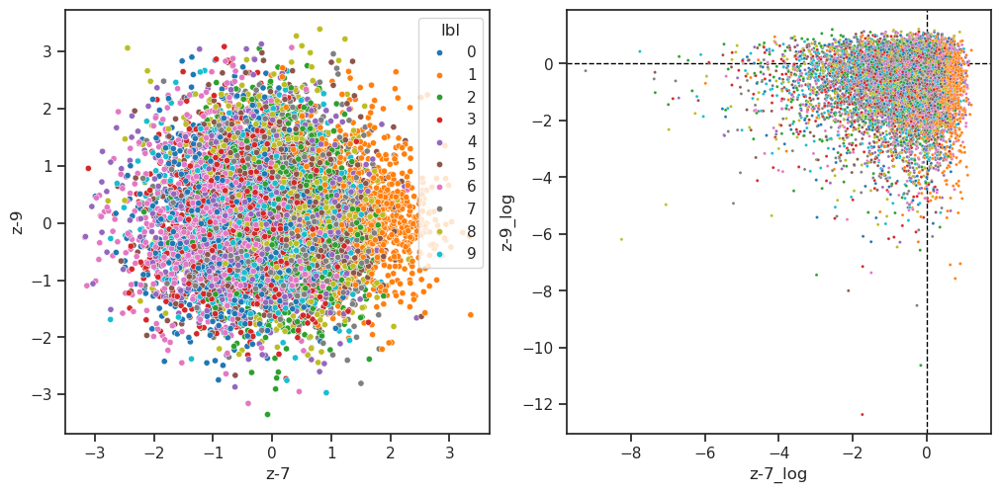

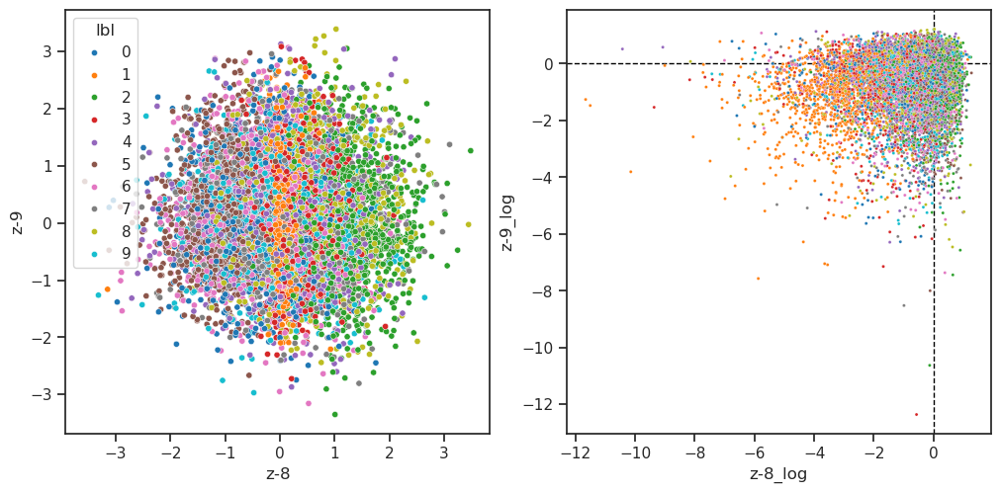

In [22]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j, 'mu')